# Libraries

In [286]:
import h5py
import IPython
from collections import Counter, defaultdict
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pickle
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import homog eneity_score, completeness_score, adjusted_rand_score
from sklearn.mixture import GaussianMixture
from tqdm.notebook import tqdm

from audiofeatures import encode_lpc, decode_lpc

matplotlib.rcParams.update({'font.size': 12})

# Data

In [24]:
def apply_lpc(files_list, window_size, step_size, lpc_order, feature):
    files_result = []
    for file in files_list:
        with h5py.File(file, 'r+') as input_file:
            data = input_file['RawData']['Samples'][()]
        sound = data[:, 31].astype("double")
        cur_res = encode_lpc(sound, window_size, step_size, lpc_order, feature)
        files_result.append(cur_res)
    return np.column_stack(files_result)

In [25]:
FREQUENCY = 19200

DATA_FOLDER = "data"


TRAIN_FILES_LIST = [
    f"{DATA_FOLDER}/phrases01_2021.03.11_19.12.59.hdf5",
    f"{DATA_FOLDER}/phrases02_2021.03.11_19.26.24.hdf5",
    f"{DATA_FOLDER}/phrases03_2021.03.11_19.42.41.hdf5",
    f"{DATA_FOLDER}/phrases04_2021.03.11_20.40.02.hdf5"
]

TEST_FILES_LIST = [
    f"{DATA_FOLDER}/phrases05_2021.03.11_20.55.25.hdf5",
    f"{DATA_FOLDER}/phrases06_2021.03.11_21.10.53.hdf5"
]

# KMeans

## Internal metrics

In [62]:
def make_kmeans_experiment(window_size, step_size, lpc_order, features, cluster_numbers):
    silhouette_results = defaultdict(list)
    km_results = defaultdict(list)

    for feature in tqdm(features):
        X_train = apply_lpc(TRAIN_FILES_LIST, window_size, step_size, lpc_order, feature)
        sample_size = 20000 if X_train.shape[1] > 20000 else None
        for n_clusters in tqdm(cluster_numbers):
            model = KMeans(n_clusters=n_clusters).fit(X_train.T)
            silhouette_results[feature].append(silhouette_score(X_train.T, model.labels_, sample_size=sample_size))
            km_results[feature].append(-model.score(X_train.T))
    
    return silhouette_results, km_results

In [98]:
window_sizes_ms = [10, 30, 50, 100]
lpc_order = 20
features = ["lpc", "rc", "lsf", "lar"]
cluster_numbers = np.linspace(16, 30, 8).astype(int)

result_kmeans_experiment = dict()


for window_size_ms in tqdm(window_sizes_ms):
    window_size = int(window_size_ms / 1000 * FREQUENCY)
    cur_res = make_kmeans_experiment(window_size, window_size, lpc_order, features, cluster_numbers)
    result_kmeans_experiment[window_size_ms] = cur_res
    with open('pickle_results/result_kmeans_experiment.pkl', 'wb') as f:
        pickle.dump(result_kmeans_experiment, f)
# with open('pickle_results/result_kmeans_experiment.pkl', 'rb') as f:
#     result_kmeans_experiment = pickle.load(f)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

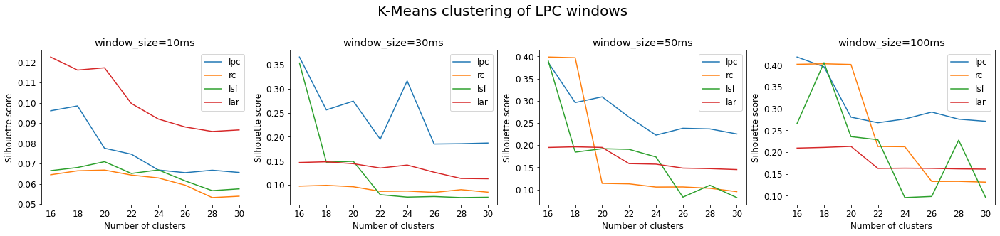

In [187]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("K-Means clustering of LPC windows", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_kmeans_experiment[window_size_ms][0][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("Silhouette score")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_kmeans_silhouette.png")

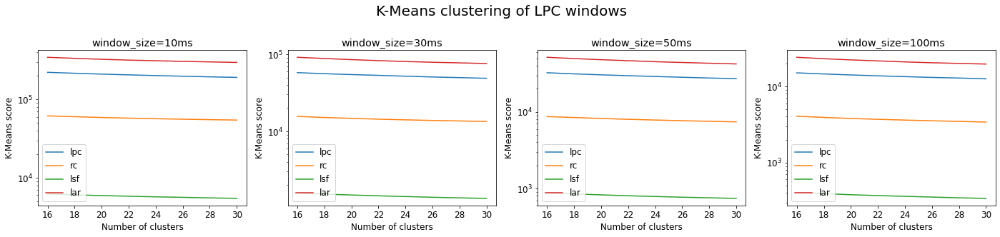

In [192]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("K-Means clustering of LPC windows", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_kmeans_experiment[window_size_ms][1][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("K-Means score")
        axs[i].set_yscale('log')
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_kmeans_score.png")

## External metrics

In [288]:
def make_kmeans_stability_experiment(window_size, step_size, lpc_order, features, cluster_numbers):
    homogeneity_results = defaultdict(list)
    completeness_results = defaultdict(list)
    ari_results = defaultdict(list)

    for feature in tqdm(features):
        X_train = apply_lpc(TRAIN_FILES_LIST, window_size, step_size, lpc_order, feature)
        X_test = apply_lpc(TEST_FILES_LIST, window_size, step_size, lpc_order, feature)
        for n_clusters in tqdm(cluster_numbers):
            model_on_train = KMeans(n_clusters=n_clusters).fit(X_train.T)
            model_on_test = KMeans(n_clusters=n_clusters).fit(X_test.T)
            labels_by_train = model_on_train.predict(X_test.T)
            labels_by_test = model_on_test.predict(X_test.T)
            homogeneity_results[feature].append(homogeneity_score(labels_by_train, labels_by_test))
            completeness_results[feature].append(completeness_score(labels_by_train, labels_by_test))
            ari_results[feature].append(adjusted_rand_score(labels_by_train, labels_by_test))
    
    return homogeneity_results, completeness_results, ari_results

In [289]:
window_sizes_ms = [10, 30, 50, 100]
lpc_order = 20
features = ["lpc", "rc", "lsf", "lar"]
cluster_numbers = np.linspace(16, 30, 8).astype(int)

result_kmeans_stability_experiment = dict()


for window_size_ms in tqdm(window_sizes_ms):
    window_size = int(window_size_ms / 1000 * FREQUENCY)
    cur_res = make_kmeans_stability_experiment(window_size, window_size, lpc_order, features, cluster_numbers)
    result_kmeans_stability_experiment[window_size_ms] = cur_res
    with open('pickle_results/result_kmeans_stability_experiment.pkl', 'wb') as f:
        pickle.dump(result_kmeans_stability_experiment, f)
# with open('pickle_results/result_kmeans_experiment.pkl', 'rb') as f:
#     result_kmeans_experiment = pickle.load(f)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

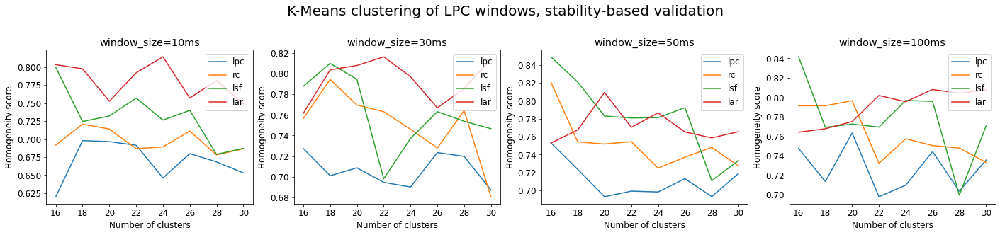

In [297]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("K-Means clustering of LPC windows, stability-based validation", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_kmeans_stability_experiment[window_size_ms][0][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("Homogeneity score")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_kmeans_homogeneity.png")

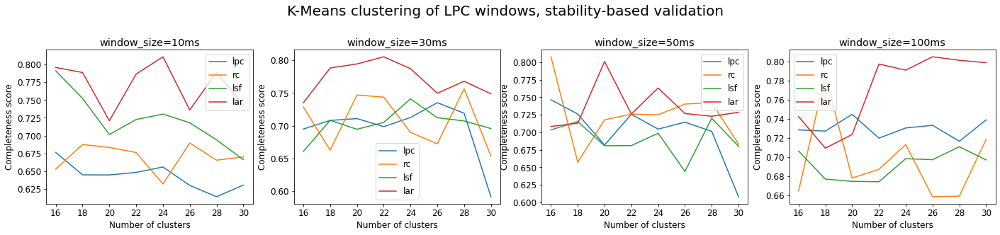

In [298]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("K-Means clustering of LPC windows, stability-based validation", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_kmeans_stability_experiment[window_size_ms][1][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("Completeness score")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_kmeans_completeness.png")

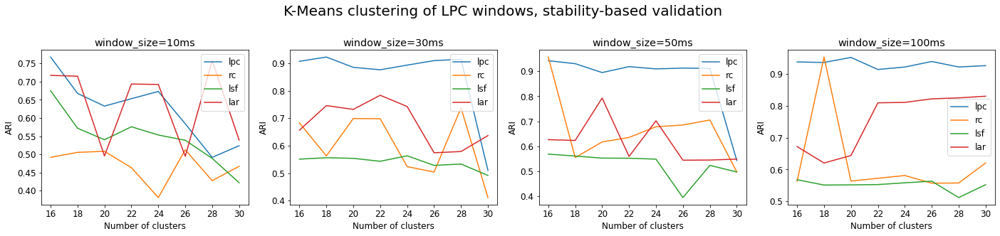

In [299]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("K-Means clustering of LPC windows, stability-based validation", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_kmeans_stability_experiment[window_size_ms][2][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("ARI")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_kmeans_ari.png")

# GMM

## Internal

In [132]:
def make_gmm_experiment(window_size, step_size, lpc_order, features, cluster_numbers):
    silhouette_results = defaultdict(list)
    aic_results = defaultdict(list)
    bic_results = defaultdict(list)
    gmm_results = defaultdict(list)

    
    for feature in tqdm(features):
        X_train = apply_lpc(TRAIN_FILES_LIST, window_size, step_size, lpc_order, feature)
        sample_size = 20000 if X_train.shape[1] > 20000 else None
        for n_clusters in tqdm(cluster_numbers):
            model = GaussianMixture(n_components=n_clusters).fit(X_train.T)
            silhouette_results[feature].append(silhouette_score(X_train.T, model.predict(X_train.T), sample_size=sample_size))
            aic_results[feature].append(-model.aic(X_train.T))
            bic_results[feature].append(-model.bic(X_train.T))
            gmm_results[feature].append(model.score(X_train.T))
    
    return silhouette_results, aic_results, bic_results, gmm_results

In [133]:
window_sizes_ms = [10, 30, 50, 100]
lpc_order = 20
features = ["lpc", "rc", "lsf", "lar"]
cluster_numbers = np.linspace(16, 30, 8).astype(int)
result_gmm_experiment = dict()


for window_size_ms in tqdm(window_sizes_ms):
    window_size = int(window_size_ms / 1000 * FREQUENCY)
    cur_res = make_gmm_experiment(window_size, window_size, lpc_order, features, cluster_numbers)
    result_gmm_experiment[window_size_ms] = cur_res
    with open('pickle_results/result_gmm_experiment_1.pkl', 'wb') as f:
        pickle.dump(result_gmm_experiment, f)
# with open('pickle_results/result_gmm_experiment_1.pkl', 'rb') as f:
#     result_kmeans_experiment = pickle.load(f)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

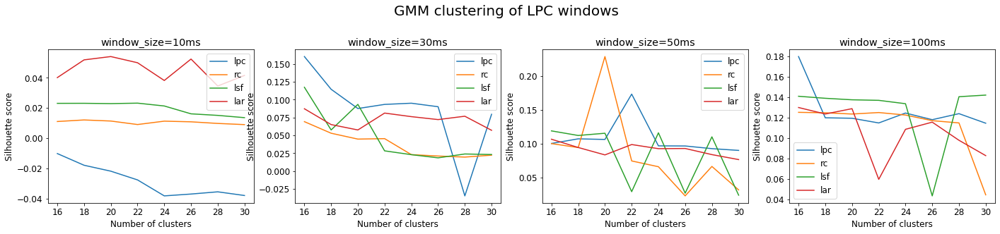

In [179]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("GMM clustering of LPC windows", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_gmm_experiment[window_size_ms][0][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("Silhouette score")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmm_silhouette.png")

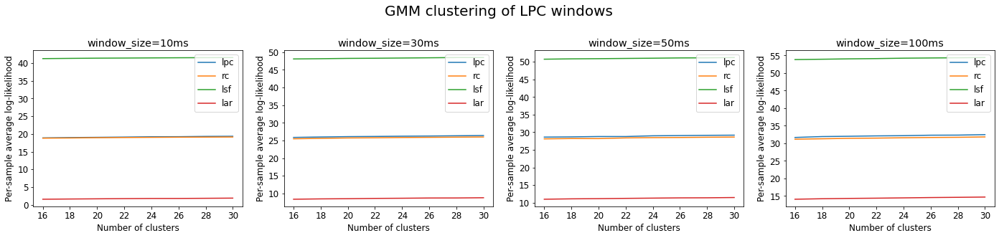

In [180]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("GMM clustering of LPC windows", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_gmm_experiment[window_size_ms][3][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("Per-sample average log-likelihood")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmm_loglik.png")

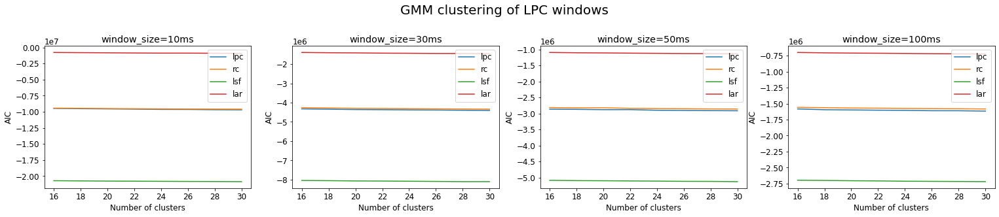

In [185]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(26, 4)
fig.suptitle("GMM clustering of LPC windows", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, -np.array(result_gmm_experiment[window_size_ms][1][feature]), label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("AIC")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmm_aic.png")

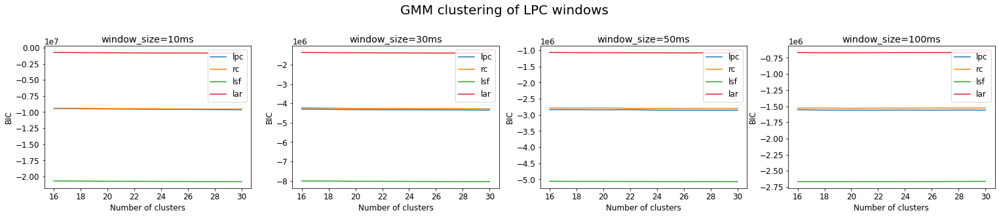

In [186]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(26, 4)
fig.suptitle("GMM clustering of LPC windows", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, -np.array(result_gmm_experiment[window_size_ms][2][feature]), label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("BIC")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmm_bic.png")

## External

In [291]:
def make_gmm_stability_experiment(window_size, step_size, lpc_order, features, cluster_numbers):
    homogeneity_results = defaultdict(list)
    completeness_results = defaultdict(list)
    ari_results = defaultdict(list)

    for feature in tqdm(features):
        X_train = apply_lpc(TRAIN_FILES_LIST, window_size, step_size, lpc_order, feature)
        X_test = apply_lpc(TEST_FILES_LIST, window_size, step_size, lpc_order, feature)
        for n_clusters in tqdm(cluster_numbers):
            model_on_train = GaussianMixture(n_components=n_clusters).fit(X_train.T)
            model_on_test = GaussianMixture(n_components=n_clusters).fit(X_test.T)
            labels_by_train = model_on_train.predict(X_test.T)
            labels_by_test = model_on_test.predict(X_test.T)
            homogeneity_results[feature].append(homogeneity_score(labels_by_train, labels_by_test))
            completeness_results[feature].append(completeness_score(labels_by_train, labels_by_test))
            ari_results[feature].append(adjusted_rand_score(labels_by_train, labels_by_test))
    
    return homogeneity_results, completeness_results, ari_results

In [292]:
window_sizes_ms = [10, 30, 50, 100]
lpc_order = 20
features = ["lpc", "rc", "lsf", "lar"]
cluster_numbers = np.linspace(16, 30, 8).astype(int)

result_gmm_stability_experiment = dict()


for window_size_ms in tqdm(window_sizes_ms):
    window_size = int(window_size_ms / 1000 * FREQUENCY)
    cur_res = make_gmm_stability_experiment(window_size, window_size, lpc_order, features, cluster_numbers)
    result_gmm_stability_experiment[window_size_ms] = cur_res
    with open('pickle_results/result_gmm_stability_experiment.pkl', 'wb') as f:
        pickle.dump(result_gmm_stability_experiment, f)
# with open('pickle_results/result_gmm_stability_experiment.pkl', 'rb') as f:
#     result_gmm_experiment = pickle.load(f)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

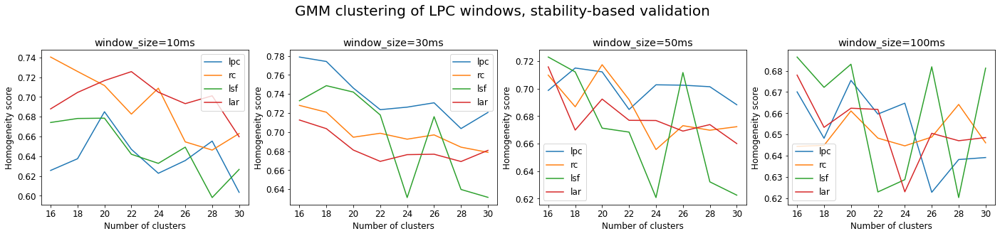

In [300]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("GMM clustering of LPC windows, stability-based validation", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_gmm_stability_experiment[window_size_ms][0][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("Homogeneity score")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmm_homogeneity.png")

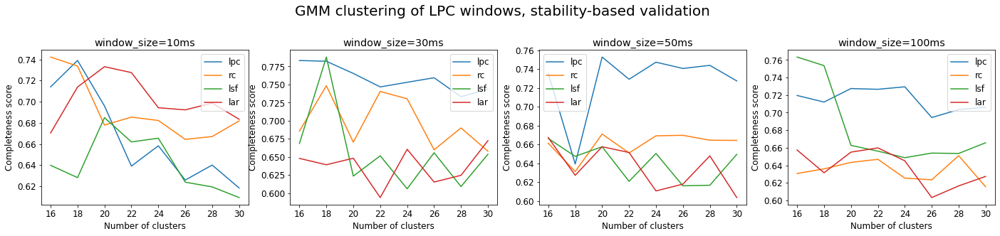

In [301]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("GMM clustering of LPC windows, stability-based validation", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_gmm_stability_experiment[window_size_ms][1][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("Completeness score")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmm_completeness.png")

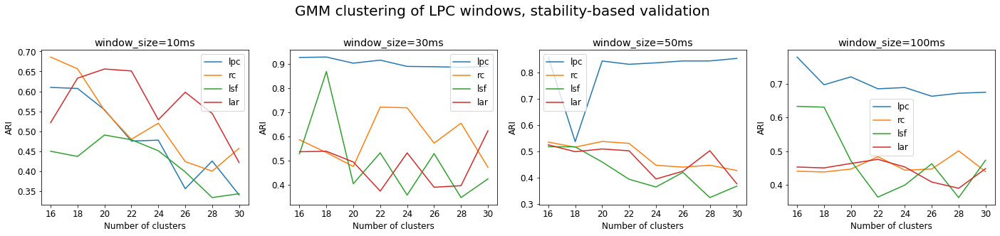

In [302]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("GMM clustering of LPC windows, stability-based validation", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_gmm_stability_experiment[window_size_ms][2][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("ARI")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmm_ari.png")

# GMM-HMM

In [137]:
from hmmlearn.hmm import GMMHMM

In [164]:
def gmmhmm_scores(model, X):
    n_params = np.sum(list(model._get_n_fit_scalars_per_param().values()))
    log_lik = model.score(X)
    aic = -2 * log_lik + 2 * n_params
    bic = -2 * log_lik + n_params * np.log(X.shape[0])
    return log_lik, aic, bic

In [168]:
def make_gmmhmm_experiment(window_size, step_size, lpc_order, features, cluster_numbers):
    silhouette_results = defaultdict(list)
    aic_results = defaultdict(list)
    bic_results = defaultdict(list)
    loglik_results = defaultdict(list)
    
    for feature in tqdm(features):
        X_train = apply_lpc(TRAIN_FILES_LIST, window_size, step_size, lpc_order, feature)
        sample_size = 20000 if X_train.shape[1] > 20000 else None
        for n_clusters in tqdm(cluster_numbers):
            model = GMMHMM(n_components=n_clusters).fit(X_train.T)
            log_lik, aic, bic = gmmhmm_scores(model, X_train.T)
            silhouette = silhouette_score(X_train.T, model.predict(X_train.T), sample_size=sample_size)
            silhouette_results[feature].append(silhouette)
            aic_results[feature].append(aic)
            bic_results[feature].append(bic)
            loglik_results[feature].append(log_lik)
    
    return silhouette_results, aic_results, bic_results, loglik_results

In [169]:
window_sizes_ms = [10, 30, 50, 100]
lpc_order = 20
features = ["lpc", "rc", "lsf", "lar"]
cluster_numbers = np.linspace(16, 30, 8).astype(int)
result_gmmhmm_experiment = dict()


for window_size_ms in tqdm(window_sizes_ms):
    window_size = int(window_size_ms / 1000 * FREQUENCY)
    cur_res = make_gmmhmm_experiment(window_size, window_size, lpc_order, features, cluster_numbers)
    result_gmmhmm_experiment[window_size_ms] = cur_res
    with open('pickle_results/result_gmmhmm_experiment_1.pkl', 'wb') as f:
        pickle.dump(result_gmmhmm_experiment, f)
# with open('pickle_results/result_gmmhmm_experiment_1.pkl', 'rb') as f:
#     result_kmeans_experiment = pickle.load(f)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

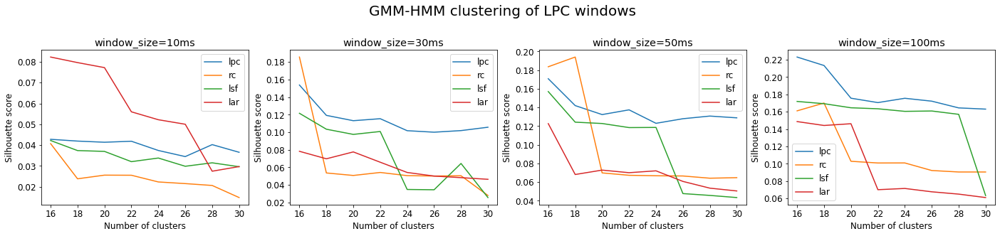

In [175]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("GMM-HMM clustering of LPC windows", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_gmmhmm_experiment[window_size_ms][0][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("Silhouette score")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmmhmm_silhouette.png")

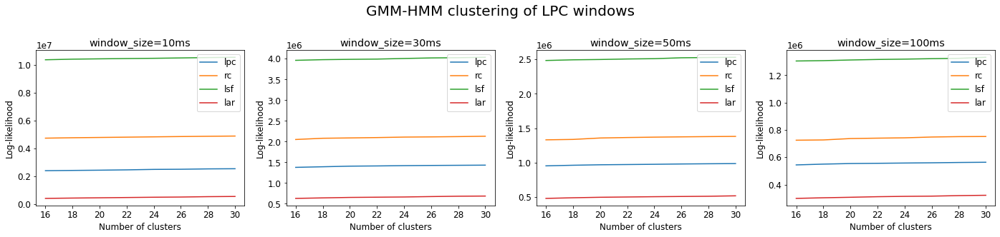

In [176]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("GMM-HMM clustering of LPC windows", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_gmmhmm_experiment[window_size_ms][3][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("Log-likelihood")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmmhmm_loglik.png")

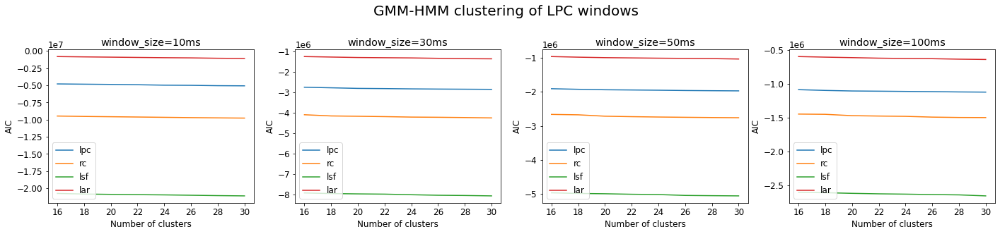

In [177]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("GMM-HMM clustering of LPC windows", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_gmmhmm_experiment[window_size_ms][1][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("AIC")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmmhmm_aic.png")

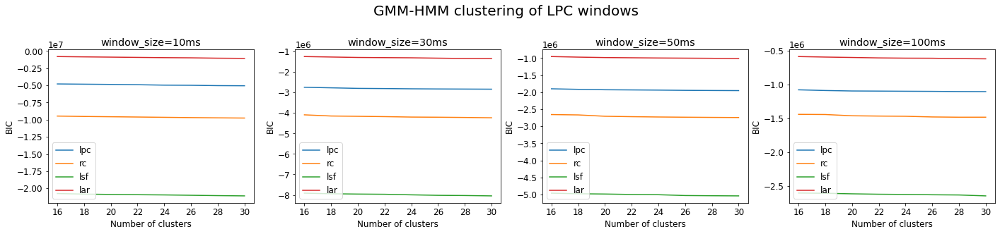

In [178]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("GMM-HMM clustering of LPC windows", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_gmmhmm_experiment[window_size_ms][2][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("BIC")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmmhmm_bic.png")

In [293]:
def make_gmmhmm_stability_experiment(window_size, step_size, lpc_order, features, cluster_numbers):
    homogeneity_results = defaultdict(list)
    completeness_results = defaultdict(list)
    ari_results = defaultdict(list)

    for feature in tqdm(features):
        X_train = apply_lpc(TRAIN_FILES_LIST, window_size, step_size, lpc_order, feature)
        X_test = apply_lpc(TEST_FILES_LIST, window_size, step_size, lpc_order, feature)
        for n_clusters in tqdm(cluster_numbers):
            model_on_train = GMMHMM(n_components=n_clusters).fit(X_train.T)
            model_on_test = GMMHMM(n_components=n_clusters).fit(X_test.T)
            labels_by_train = model_on_train.predict(X_test.T)
            labels_by_test = model_on_test.predict(X_test.T)
            homogeneity_results[feature].append(homogeneity_score(labels_by_train, labels_by_test))
            completeness_results[feature].append(completeness_score(labels_by_train, labels_by_test))
            ari_results[feature].append(adjusted_rand_score(labels_by_train, labels_by_test))
    
    return homogeneity_results, completeness_results, ari_results

In [294]:
window_sizes_ms = [10, 30, 50, 100]
lpc_order = 20
features = ["lpc", "rc", "lsf", "lar"]
cluster_numbers = np.linspace(16, 30, 8).astype(int)

result_gmmhmm_stability_experiment = dict()


for window_size_ms in tqdm(window_sizes_ms):
    window_size = int(window_size_ms / 1000 * FREQUENCY)
    cur_res = make_gmmhmm_stability_experiment(window_size, window_size, lpc_order, features, cluster_numbers)
    result_gmmhmm_stability_experiment[window_size_ms] = cur_res
    with open('pickle_results/result_gmmhmm_stability_experiment.pkl', 'wb') as f:
        pickle.dump(result_gmmhmm_stability_experiment, f)
# with open('pickle_results/result_gmmhmm_stability_experiment.pkl', 'rb') as f:
#     result_gmm_experiment = pickle.load(f)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

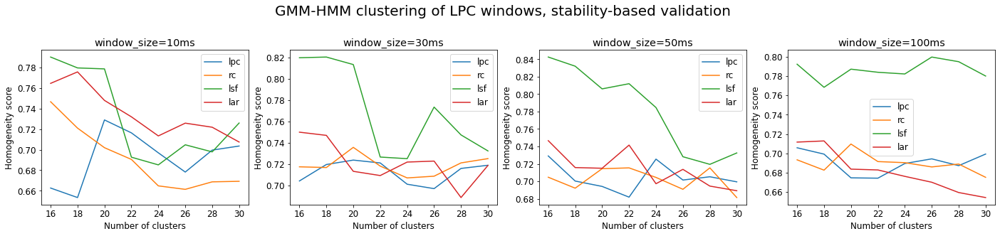

In [303]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("GMM-HMM clustering of LPC windows, stability-based validation", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_gmmhmm_stability_experiment[window_size_ms][0][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("Homogeneity score")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmmhmm_homogeneity.png")

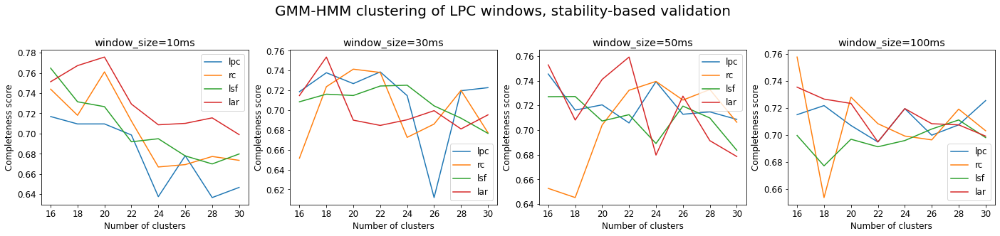

In [304]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("GMM-HMM clustering of LPC windows, stability-based validation", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_gmmhmm_stability_experiment[window_size_ms][1][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("Completeness score")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmmhmm_completeness.png")

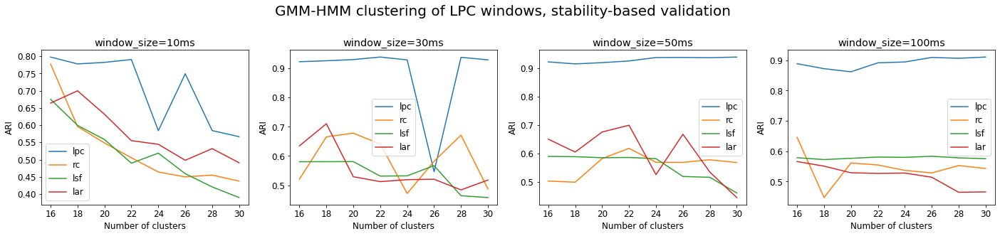

In [305]:
fig, axs = plt.subplots(1, len(window_sizes_ms))
fig.set_size_inches(24, 4)
fig.suptitle("GMM-HMM clustering of LPC windows, stability-based validation", verticalalignment="top", y=1.1, fontsize=20)
for i, window_size_ms in enumerate(window_sizes_ms):
        for feature in features:
            axs[i].plot(cluster_numbers, result_gmmhmm_stability_experiment[window_size_ms][2][feature], label=feature)
        axs[i].legend()
        axs[i].set_xlabel("Number of clusters")
        axs[i].set_ylabel("ARI")
        axs[i].set_title(f"window_size={window_sizes_ms[i]}ms")
plt.savefig("pictures/lpc_gmmhmm_ari.png")

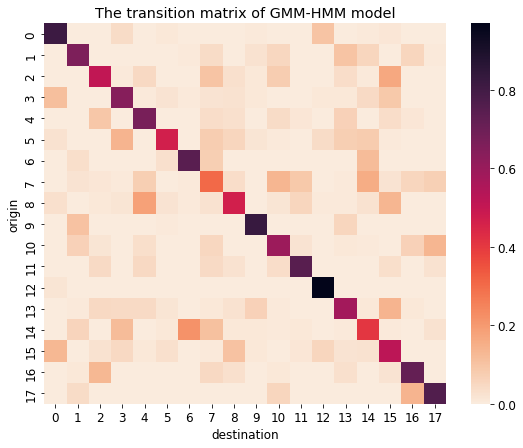

In [374]:
X_train = apply_lpc(TRAIN_FILES_LIST, int(0.03 * FREQUENCY), int(0.03 * FREQUENCY), 20, "lsf")
gmmhmm_model = GMMHMM(n_components=18).fit(X_train.T)
plt.figure(figsize=(9,7))
sns.heatmap(gmmhmm_model.transmat_, cmap="rocket_r")
plt.xlabel("destination")
plt.ylabel("origin")
plt.title("The transition matrix of GMM-HMM model");

# Decode & play

In [231]:
def lpc_encode_and_decode(cluster_model, files_list, feature, lpc_order, window_size, step_size):
    X = apply_lpc(files_list, window_size, step_size, lpc_order, feature)
    cluster_model.fit(X.T)
    cluster_labels = cluster_model.predict(X.T)
    if isinstance(cluster_model, GaussianMixture):
        cluster_centers = cluster_model.means_
    elif isinstance(cluster_model, GMMHMM):
        cluster_centers = np.squeeze(cluster_model.means_)
    else:
        cluster_centers = cluster_model.cluster_centers_
    X_quantized = cluster_centers[cluster_labels].T
    x = decode_lpc(X_quantized, window_size, step_size, feature)
    return x

## K-Means

### Source

In [234]:
source_sound = []
for file in TRAIN_FILES_LIST:
    with h5py.File(file, 'r+') as input_file:
        data = input_file['RawData']['Samples'][()]
    sound = data[:, 31].astype("double")
    source_sound.append(sound)
source_sound = np.concatenate(source_sound)

In [307]:
IPython.display.display(IPython.display.Audio(data=source_sound[5 * FREQUENCY:100 * FREQUENCY], rate=FREQUENCY))

In [320]:
IPython.display.display(IPython.display.Audio(data=source_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

### 10ms

In [321]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=18), TRAIN_FILES_LIST, "lpc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 20s, sys: 20.2 s, total: 1min 40s
Wall time: 25.2 s


> 3

In [322]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=18), TRAIN_FILES_LIST, "rc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 3min 28s, sys: 13.8 s, total: 3min 42s
Wall time: 2min 50s


> 3

In [323]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=16), TRAIN_FILES_LIST, "lsf", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 2min 13s, sys: 13.4 s, total: 2min 26s
Wall time: 1min 38s


> 3.5

In [324]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=24), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 3min 47s, sys: 17.6 s, total: 4min 5s
Wall time: 2min 55s


> 3.5

In [325]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=16), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 3min 25s, sys: 12.9 s, total: 3min 38s
Wall time: 2min 50s


> 3.5

### 30ms

In [326]:
%%time
window_size = int(0.03 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=16), TRAIN_FILES_LIST, "lpc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 30 s, sys: 11.8 s, total: 41.8 s
Wall time: 13.1 s


> 2.5

In [327]:
%%time
window_size = int(0.03 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=20), TRAIN_FILES_LIST, "rc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 22s, sys: 12.2 s, total: 1min 35s
Wall time: 1min 2s


> 3

In [328]:
%%time
window_size = int(0.03 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=16), TRAIN_FILES_LIST, "lsf", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 55.4 s, sys: 10.5 s, total: 1min 5s
Wall time: 39.1 s


> 3.5

In [329]:
%%time
window_size = int(0.03 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=22), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 29s, sys: 10.7 s, total: 1min 40s
Wall time: 1min 4s


> 3.5

### 50ms

In [330]:
%%time
window_size = int(0.05 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=16), TRAIN_FILES_LIST, "lpc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 25.9 s, sys: 7.99 s, total: 33.9 s
Wall time: 11.7 s


> 2

In [331]:
%%time
window_size = int(0.05 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=16), TRAIN_FILES_LIST, "rc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 55.2 s, sys: 10.2 s, total: 1min 5s
Wall time: 41.6 s


> 2.5

In [332]:
%%time
window_size = int(0.05 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=16), TRAIN_FILES_LIST, "lsf", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 40.2 s, sys: 10.1 s, total: 50.3 s
Wall time: 27 s


> 4

In [333]:
%%time
window_size = int(0.05 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=20), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 57.4 s, sys: 11.5 s, total: 1min 8s
Wall time: 41.7 s


> 4

### 100ms

In [334]:
%%time
window_size = int(0.1 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=16), TRAIN_FILES_LIST, "lpc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 15.6 s, sys: 8.12 s, total: 23.7 s
Wall time: 9.28 s


> 2

In [335]:
%%time
window_size = int(0.1 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=18), TRAIN_FILES_LIST, "rc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 32.9 s, sys: 10.2 s, total: 43.1 s
Wall time: 24.8 s


> 2.5

In [336]:
%%time
window_size = int(0.1 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=16), TRAIN_FILES_LIST, "lsf", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 22.7 s, sys: 9.56 s, total: 32.2 s
Wall time: 17.3 s


> 4

In [337]:
%%time
window_size = int(0.1 * FREQUENCY)
result_sound = lpc_encode_and_decode(KMeans(n_clusters=22), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 39.5 s, sys: 8.81 s, total: 48.3 s
Wall time: 26.3 s


> 4

### Вывод

- lpc < rc < lsf ~ lar
- от размера окна нет особой зависимости

## GMM

### 10ms

In [339]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=18), TRAIN_FILES_LIST, "lpc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 12min 58s, sys: 1min 41s, total: 14min 40s
Wall time: 2min 9s


> 3.5

In [340]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=16), TRAIN_FILES_LIST, "rc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 8min 2s, sys: 41.7 s, total: 8min 44s
Wall time: 3min 33s


> 3

In [341]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=20), TRAIN_FILES_LIST, "lsf", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 8min, sys: 56.8 s, total: 8min 57s
Wall time: 2min 30s


> 3.5

In [342]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=20), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 9min 57s, sys: 1min 2s, total: 11min
Wall time: 3min 52s


> 3.5

### 30ms

In [343]:
%%time
window_size = int(0.03 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=16), TRAIN_FILES_LIST, "lpc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 55s, sys: 8.51 s, total: 2min 3s
Wall time: 24.2 s


> 4

In [344]:
%%time
window_size = int(0.03 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=18), TRAIN_FILES_LIST, "rc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 2min 55s, sys: 10.7 s, total: 3min 6s
Wall time: 1min 16s


> 3

In [345]:
%%time
window_size = int(0.03 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=18), TRAIN_FILES_LIST, "lsf", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 3min 18s, sys: 13.2 s, total: 3min 31s
Wall time: 59 s


> 4

In [346]:
%%time
window_size = int(0.03 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=16), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 2min 32s, sys: 8.32 s, total: 2min 40s
Wall time: 1min 14s


> 3.5

### 50ms

In [347]:
%%time
window_size = int(0.05 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=20), TRAIN_FILES_LIST, "lpc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 3min 21s, sys: 17 s, total: 3min 38s
Wall time: 36 s


> 4

In [348]:
%%time
window_size = int(0.05 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=20), TRAIN_FILES_LIST, "rc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 2min 11s, sys: 9.02 s, total: 2min 20s
Wall time: 53.2 s


> 3.5

In [349]:
%%time
window_size = int(0.05 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=16), TRAIN_FILES_LIST, "lsf", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 23s, sys: 6.72 s, total: 1min 30s
Wall time: 32.6 s


> 3

In [350]:
%%time
window_size = int(0.05 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=16), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 56s, sys: 8.66 s, total: 2min 4s
Wall time: 50.7 s


> 2.5

### 100ms

In [351]:
%%time
window_size = int(0.1 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=16), TRAIN_FILES_LIST, "lpc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 23s, sys: 8.05 s, total: 1min 31s
Wall time: 18.3 s


> 2.5

In [353]:
%%time
window_size = int(0.1 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=20), TRAIN_FILES_LIST, "rc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 3min 19s, sys: 8.69 s, total: 3min 28s
Wall time: 51.3 s


> 2.5

In [352]:
%%time
window_size = int(0.1 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=16), TRAIN_FILES_LIST, "lsf", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 32s, sys: 7.78 s, total: 1min 39s
Wall time: 27 s


> 2.5

In [354]:
%%time
window_size = int(0.1 * FREQUENCY)
result_sound = lpc_encode_and_decode(GaussianMixture(n_components=16), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 4s, sys: 5.03 s, total: 1min 9s
Wall time: 30.2 s


> 2.5

### Выводы

Тут важным фактором оказался размер окна:
на уровне 10мс создаются некие выбросы при произношении, а при >=50мс речь становится более расплывчатой. На удивление, LPC коеф здесь себя неплохо показали.

## GMM-HMM

### 10ms

In [355]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=20), TRAIN_FILES_LIST, "lpc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 2min 1s, sys: 25.9 s, total: 2min 27s
Wall time: 1min 2s


> 2.5

In [356]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=16), TRAIN_FILES_LIST, "rc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 3min 52s, sys: 19.3 s, total: 4min 11s
Wall time: 3min 13s


> 3

In [357]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=16), TRAIN_FILES_LIST, "lsf", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 2min 47s, sys: 20.3 s, total: 3min 7s
Wall time: 2min 2s


> 3.5

In [358]:
%%time
window_size = int(0.01 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=18), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 4min 4s, sys: 19.7 s, total: 4min 23s
Wall time: 3min 21s


> 3.5

### 30ms

In [359]:
%%time
window_size = int(0.03 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=18), TRAIN_FILES_LIST, "lpc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 46.3 s, sys: 13.2 s, total: 59.5 s
Wall time: 23.6 s


> 1

In [360]:
%%time
window_size = int(0.03 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=18), TRAIN_FILES_LIST, "rc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 34s, sys: 14.8 s, total: 1min 49s
Wall time: 1min 13s


> 2.5

In [361]:
%%time
window_size = int(0.03 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=18), TRAIN_FILES_LIST, "lsf", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 9s, sys: 12.4 s, total: 1min 22s
Wall time: 48.1 s


> 4

In [362]:
%%time
window_size = int(0.03 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=18), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 35s, sys: 12 s, total: 1min 47s
Wall time: 1min 13s


> 4

### 50ms

In [363]:
%%time
window_size = int(0.05 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=16), TRAIN_FILES_LIST, "lpc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 31.5 s, sys: 11.2 s, total: 42.8 s
Wall time: 16.1 s


> 1

In [364]:
%%time
window_size = int(0.05 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=18), TRAIN_FILES_LIST, "rc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 2s, sys: 12.5 s, total: 1min 15s
Wall time: 46.9 s


> 3

In [365]:
%%time
window_size = int(0.05 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=16), TRAIN_FILES_LIST, "lsf", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 47.5 s, sys: 11.1 s, total: 58.6 s
Wall time: 31.8 s


> 3

In [366]:
%%time
window_size = int(0.05 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=16), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 1min 6s, sys: 13.2 s, total: 1min 19s
Wall time: 47.6 s


> 3

### 100ms

In [367]:
%%time
window_size = int(0.1 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=16), TRAIN_FILES_LIST, "lpc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 23.5 s, sys: 11.2 s, total: 34.7 s
Wall time: 13.1 s


> 0

In [368]:
%%time
window_size = int(0.1 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=16), TRAIN_FILES_LIST, "rc", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 39.2 s, sys: 9.27 s, total: 48.5 s
Wall time: 27.4 s


> 2

In [369]:
%%time
window_size = int(0.1 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=16), TRAIN_FILES_LIST, "lsf", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 29.7 s, sys: 13.1 s, total: 42.8 s
Wall time: 20.5 s


> 2.5

In [370]:
%%time
window_size = int(0.1 * FREQUENCY)
result_sound = lpc_encode_and_decode(GMMHMM(n_components=16), TRAIN_FILES_LIST, "lar", 20, window_size, window_size)
IPython.display.display(IPython.display.Audio(data=result_sound[19 * FREQUENCY:23 * FREQUENCY], rate=FREQUENCY))

CPU times: user 45.8 s, sys: 8.23 s, total: 54 s
Wall time: 29.1 s


> 2.5

### Выводы

- lpc себя ужасно отработал, rc лучше, но лучшие тут lsf и lar
- аналогично как при GMM важным является размер окна: при маленьком окне будут вибрации во время речи, при большом окне речь будет расплывчата. Оптимальный размер окна: 30ms